# **Consumption Seasonality Analysis (EN) | Análise de Sazonalidade de Consumo (PT)**

## ***Importing libraries and loading the database (EN) | Importando bibliotecas e carregando a base de dados (PT)***

Initially we will load some useful libraries for this project along with the databases, in addition to performing some specific configurations for the database. (EN)

---

Inicialmente vamos carregar algumas bibliotecas utéis para este projeto juntamente com as bases de dados, além de realizar algumas configurações específicas para a base de dados (PT)

In [39]:
import pandas as pd
from datetime import date, datetime
import dateutil.parser
import matplotlib.pyplot as plt
import numpy as np
from statsmodels.tsa.deterministic import DeterministicProcess
from sklearn.preprocessing import StandardScaler


consumo = pd.read_excel("C:/Users/joaov/OneDrive/Área de Trabalho/Python/Análise de Consumo/CONSUMO TRAFO 30KVA.xlsx", parse_dates=['Entrado em'])

# Transforming indexes into datetime type, sorting and grouping by days (EN) | Transformando os índices em tipo datetime, classificando e agrupando por dias (PT)
for i in consumo.index:
    data = str(consumo['Entrado em'][i])
    datetime_object = dateutil.parser.parse(data)
    data = datetime_object.strftime("%d/%m/%y")
    data = datetime.strptime(data, '%d/%m/%y')
    consumo['Entrado em'][i] = data
consumo = consumo[['Entrado em','Qtd.']]
consumo = consumo.sort_values(by='Entrado em')
consumo_group = consumo.groupby(by='Entrado em').sum()

# All positive values ​​should be considered as 0 and negative values ​​will be positive (EN) | Todos os valores positivos devem ser considerados como 0 e os negativos serão positivos (PT)
for i in range(0, consumo_group.index.value_counts().sum()):
    if consumo_group['Qtd.'][i] >= 0:
        consumo_group['Qtd.'][i] = 0
    elif consumo_group['Qtd.'][i] < 0:
        consumo_group['Qtd.'][i] = consumo_group['Qtd.'][i]*-1
        

C:\Users\joaov\AppData\Local\Temp\ipykernel_6720\3387261760.py:18: FutureWarning: ChainedAssignmentError: behaviour will change in pandas 3.0!
You are setting values through chained assignment. Currently this works in certain cases, but when using Copy-on-Write (which will become the default behaviour in pandas 3.0) this will never work to update the original DataFrame or Series, because the intermediate object on which we are setting values will behave as a copy.
A typical example is when you are setting values in a column of a DataFrame, like:

df["col"][row_indexer] = value

Use `df.loc[row_indexer, "col"] = values` instead, to perform the assignment in a single step and ensure this keeps updating the original `df`.

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

  consumo['Entrado em'][i] = data
C:\Users\joaov\AppData\Local\Temp\ipykernel_6720\3387261760.py:18: SettingWithCopyWarning: 
A va

## **Visualizations Configs (EN) | Configurações da Visualização de Dados (PT)**

In [40]:
plt.rc("figure", autolayout=True, figsize=(11, 5))
plt.rc(
    "axes",
    labelweight="bold",
    labelsize="large",
    titleweight="bold",
    titlesize=14,
    titlepad=10,
)
plot_params = dict(
    color="0.75",
    style=".-",
    markeredgecolor="0.25",
    markerfacecolor="0.25",
    legend=False,
)

## **Exploratory Analysis (EN) | Análise Exploratória (PT)**

Now we can get a general feel for our data to identify points that will be relevant in the pre-processing step (EN)

- How de consumpiton feature behaves
- Are there any missing values
- Identify patterns, trends and possible anomalies

---

Agora podemos dar uma olhada geral nos nossos dados para identificar pontos que serão relevantes na etapa de pré processamento (PT)

- Como o consumo se comporta
- Existe alguma coluna com valor faltantes
- Identificar padrões, tendências e possíveis anomalias

In [41]:
# How many rows do we have (EN) | Quantas linhas temos? (PT)
consumo_group.shape

(1155, 1)

In [42]:
# Average, standard deviation, minimum and maximum consumption data grouped by months (EN) | Dados de média, desvio padrão, minimo e máximo dos consumos agrupados por meses (PT)
consumo_group.groupby(consumo_group.index.to_period('M')).describe().T

Entrado em    2020-01    2020-02    2020-03    2020-04    2020-05    2020-06  \
Qtd. count  26.000000  20.000000  23.000000  24.000000  23.000000  22.000000   
     mean    4.730769   3.500000   5.521739   2.750000   5.391304   6.227273   
     std     4.152664   3.284733   5.375615   2.288915   4.599794   4.699866   
     min     0.000000   0.000000   0.000000   0.000000   0.000000   0.000000   
     25%     2.000000   1.000000   1.000000   1.000000   1.500000   1.250000   
     50%     4.000000   2.000000   5.000000   2.000000   4.000000   7.500000   
     75%     7.000000   6.000000   7.500000   4.000000  10.000000  10.750000   
     max    15.000000  12.000000  21.000000   7.000000  13.000000  15.000000   

Entrado em    2020-07    2020-08    2020-09    2020-10    2020-11    2020-12  \
Qtd. count  25.000000  24.000000  24.000000  24.000000  20.000000  19.000000   
     mean    4.000000   3.458333   2.916667   3.166667   3.700000   3.052632   
     std     3.523729   3.776117   2.500725   3.996375   3.096688   2.247806   
     min     0.000000   0.000000   0.000000   0.000000   0.000000   0.000000   
     25%     2.000000   1.000000   1.000000   0.750000   1.750000   1.000000   
     50%     3.000000   2.000000   2.500000   1.500000   3.500000   3.000000   
     75%     7.000000   5.000000   5.000000   5.000000   5.000000   4.000000   
     max    12.000000  15.000000   9.000000  17.000000  11.000000   8.000000   

Entrado em    2021-01    2021-02   2021-03    2021-04    2021-05    2021-06  \
Qtd. count  19.000000  19.000000  23.00000  22.000000  22.000000  26.000000   
     mean    6.789474   3.842105   4.00000   3.136364   4.227273   4.230769   
     std     5.553567   4.764022   3.21926   3.090623   3.637527   3.456098   
     min     0.000000   0.000000   0.00000   0.000000   0.000000   0.000000   
     25%     4.500000   1.000000   1.00000   1.000000   1.000000   1.250000   
     50%     6.000000   2.000000   3.00000   2.000000   3.000000   3.000000   
     75%     7.500000   5.500000   6.50000   5.000000   6.750000   7.500000   
     max    25.000000  21.000000  13.00000  11.000000  12.000000  11.000000   

Entrado em    2021-07    2021-08    2021-09    2021-10    2021-11    2021-12  \
Qtd. count  28.000000  28.000000  26.000000  26.000000  24.000000  25.000000   
     mean    5.000000   5.964286   4.307692   4.423077   4.333333   2.840000   
     std     6.122212   4.013700   2.895089   3.689695   2.425708   2.544275   
     min     0.000000   0.000000   0.000000   0.000000   0.000000   0.000000   
     25%     1.000000   3.000000   2.250000   1.000000   3.000000   1.000000   
     50%     4.000000   5.000000   4.000000   5.000000   5.000000   2.000000   
     75%     6.000000   9.000000   5.750000   6.750000   6.000000   4.000000   
     max    31.000000  14.000000  11.000000  13.000000  10.000000   9.000000   

Entrado em    2022-01    2022-02    2022-03    2022-04    2022-05    2022-06  \
Qtd. count  23.000000  23.000000  28.000000  27.000000  24.000000  25.000000   
     mean    3.869565   3.304348   4.607143   4.814815   4.250000   5.680000   
     std     4.192031   3.623594   3.059161   4.977156   4.152003   5.580621   
     min     0.000000   0.000000   0.000000   0.000000   0.000000   0.000000   
     25%     1.000000   1.000000   2.000000   1.000000   1.750000   1.000000   
     50%     3.000000   2.000000   4.500000   3.000000   3.500000   4.000000   
     75%     4.500000   4.000000   7.000000   7.500000   5.250000   9.000000   
     max    18.000000  16.000000  11.000000  17.000000  16.000000  20.000000   

Entrado em    2022-07    2022-08    2022-09    2022-10    2022-11    2022-12  \
Qtd. count  24.000000  25.000000  26.000000  25.000000  26.000000  24.000000   
     mean    6.208333   5.120000   5.153846   5.200000   6.461538   4.916667   
     std     4.951760   4.539824   4.115262   4.983305   5.714758   4.221237   
     min     0.000000   0.000000   0.000000   0.000000   0.000000   0.000000   
    

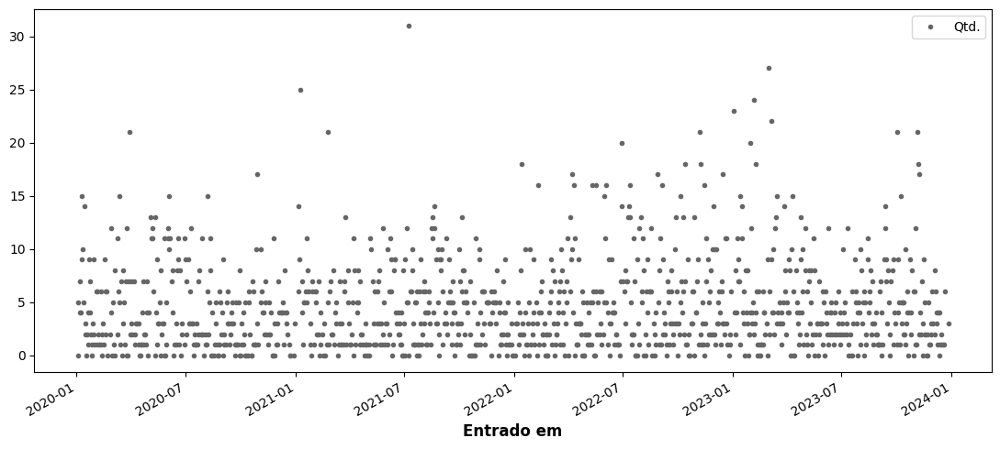

In [43]:
# Consumption data visualization (EN) | Visualização dos dados de consumo (PT)
a = consumo_group.plot(style=".", color="0.4")

Por essa visualização podemos notar que os dados estão bastantes dispersos, precisamos tratar estes outliers de alguma forma (PT) | By this graph we can notice that the data is very disperse, we have to deal with the outliers (EN)

In [44]:
# Não existem dados faltantes (PT) | There are no missing values (EN)
consumo_group['Qtd.'].isna().sum()

np.int64(0)

## **Spliting data (EN) | Dividindo os dados (PT)**

Stage where we will split our data in training and validation data (EN)

---

Etapa de divisão dos dados para treinamento do modelo e validação (PT)

In [149]:
consumo_group_train = consumo_group.loc[consumo_group.index < '2023-01']
consumo_group_val = consumo_group.loc[consumo_group.index >= '2023-01']

## **Pre-processing step (EN) | Etapa de pré-processamento (PT)**

Aqui iremos tratar a base de dados para que fique pronta para a etapa de previsão, como alguns dias não estão presentes no dataset (porque nesses dias não houve consumo) precisamos inferir uma frequência para que o algoritmo possa realizar a previsão, isso acrescenta na base algumas datas sem valores de consumo, por isso precisamos tratar os valores faltantes.

Além disso foi identificado na etapa de análise exploratória que a base tem alguns outliers, vamos tratá-los (PT)

---

Here we will process the database so that it is ready for the forecasting stage. Since some days are not present in the data set (because there was no consumption on those days), we need to infer a frequency so that the algorithm can perform the forecast. This adds some data to the database without consumption values, so we need to process the missing values.

In addition, it was identified in the exploratory analysis stage that the database has some outliers. We will process them (EN)

In [150]:
# Inferring frequency in the databases (EN) | Inferindo frequência nas bases de dados (PT)
consumo_group_train = consumo_group_train.asfreq(pd.infer_freq(consumo_group_train.index))
consumo_group_val = consumo_group_val.asfreq(pd.infer_freq(consumo_group_val.index))

In [151]:
# Ao inferir frequência na base de dados, podemos ter criado linhas com dados faltantes (PT) | When inferring frequency in the database, we may have created rows with missing data (EN)
consumo_group_train['Qtd.'] = consumo_group_train['Qtd.'].fillna(0)
consumo_group_val['Qtd.'] = consumo_group_val['Qtd.'].fillna(0)

#### **Tratamento de Outliers (PT)**

In [152]:
# Calculando a média e o desvio padrão (PT) | Calculating mean and standard deviation (EN)
mean_train = consumo_group_train['Qtd.'].mean()
std_train = consumo_group_train['Qtd.'].std()
mean_val = consumo_group_val['Qtd.'].mean()
std_val = consumo_group_val['Qtd.'].std()

# Definindo o limite para outliers (PT) | Defining the outliers limits (EN)
cut_off_train = std_train * 3
cut_off_val = std_val * 3
lower_train, upper_train = mean_train - cut_off_train, mean_train + cut_off_train
lower_val, upper_val = mean_val - cut_off_val, mean_val + cut_off_val

# Removendo outliers
consumo_group_train = consumo_group_train.loc[(consumo_group_train.values <= upper_train) & (consumo_group_train.values >= lower_train)]
consumo_group_val = consumo_group_val.loc[(consumo_group_val.values <= upper_val) & (consumo_group_val.values >= lower_val)]

In [153]:
# Representando o consumo mensal (objetivo da previsão) (PT) | Representing monthly consumption (forecast objective) (EN)
consumo_group_train['MÊS_ANO'] = consumo_group_train.index.to_period("M")
consumo_group_train = consumo_group_train.groupby('MÊS_ANO').sum()
consumo_group_val['MÊS_ANO'] = consumo_group_val.index.to_period("M")
consumo_group_val = consumo_group_val.groupby('MÊS_ANO').sum()

## **Previsão (PT) | Forecasting (EN)**

Nesta etapa iremos utilizar os conceitos de média móvel para realizar a previsão apenas com dados de tendência e posteriormente vamos utilizar os conceitos de transformada de fourier para capturar a sazonalidade da nossa série e então conseguir realizar as previsões com sazonalidade (PT)

---

In this step, we will use the concepts of moving average to make the forecast only with trend data and later we will use the concepts of Fourier transform to capture the seasonality of our series and then be able to make the forecasts with seasonality (EN)

### **Cálculo da Média Móvel (PT) | Moving Average Calculation (EN)**

Aplicação da média móvel a fim de suavizar a curva de consumo e para que consigamos obter a tendência da curva (PT)

---

Application of the moving average in order to smooth the consumption curve and so that we can obtain the curve trend (EN)

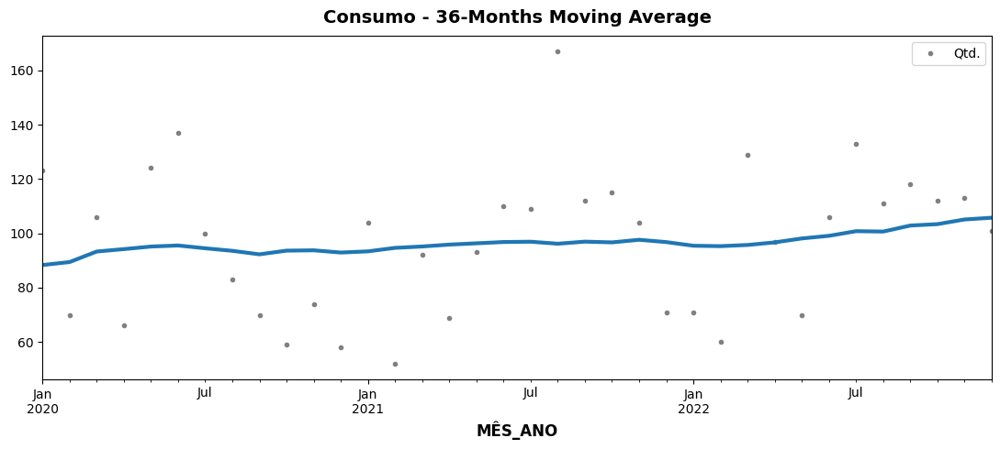

In [154]:
moving_average = consumo_group_train.rolling(
    window=36,       # janela de 42 meses
    center=True,
    min_periods=18,
).mean()

ax = consumo_group_train.plot(style=".", color="0.5")
moving_average.plot(
    ax=ax, linewidth=3, title="Consumo - 36-Months Moving Average", legend=False,
);

Precisamos criar uma feature que indique a passagem de tempo, para isso vamos utilizar o 'DeterministicProcess' (PT)

---

We have to create a time-step feature, for this we will use 'DeterministicProcess' (EN)

In [155]:
dp = DeterministicProcess(
    index=consumo_group_train.index,
    constant=True,
    order=1,
    drop=True,
)

x_train = dp.in_sample()
x_train.head()

,const,trend
MÊS_ANO,,
2020-01,1.0,1.0
2020-02,1.0,2.0
2020-03,1.0,3.0
2020-04,1.0,4.0
2020-05,1.0,5.0


### **Treinamento e Previsão do Modelo de Regressão Linear (PT) | Training and Forecasting With Linear Regression (EN)**

Aqui vamos realizar o treinamento do modelo de regressão linear, primeiramente apenas com os dados de tendência, e verificar a previsão feita pelo modelo (PT)

---

Here we will train the linear regression model, firstly only with the trend data, and check the prediction made by the model (EN)

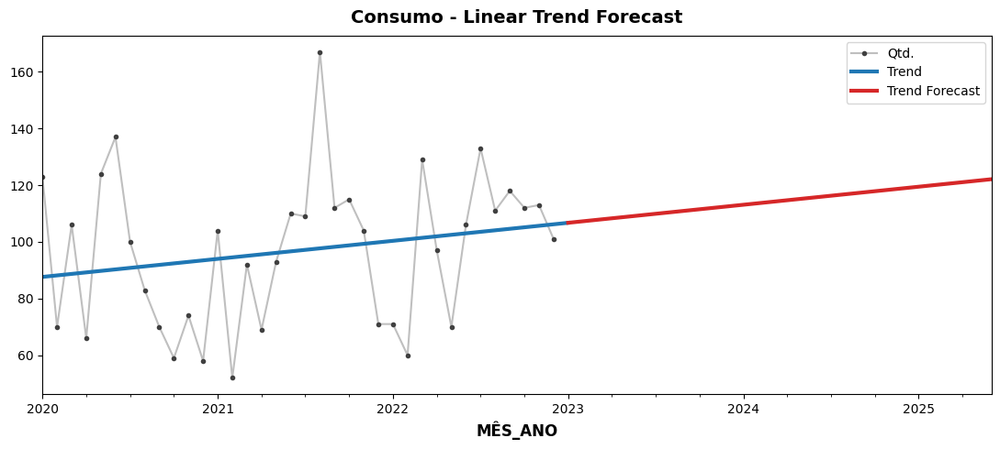

In [156]:
from sklearn.linear_model import LinearRegression

# Valor alvo (PT) | Target feature (EN)
y_train = consumo_group_train["Qtd."]

# Treinamento do modelo (PT) | Training the model (EN)
model = LinearRegression(fit_intercept=False)
model.fit(x_train, y_train)

# Previsão dos dados conhecidos (PT) | Forecasting known data (EN)
y_pred = pd.Series(model.predict(x_train), index=x_train.index)

# Previsão de novos dados (PT) | Forecasting unknown data (EN)
x_forecast = dp.out_of_sample(steps=30)
y_forecast = pd.Series(model.predict(x_forecast), index=x_forecast.index)

# Plotando resultados (PT) | Plotting the results (EN)
concat = pd.concat([y_pred, y_forecast])
ax = consumo_group_train.plot(title="Consumo - Linear Trend Forecast", **plot_params)
ax = concat.loc[concat.index<='2023-01'].plot(ax=ax, linewidth=3, label="Trend")
ax = concat.loc[concat.index>='2023-01'].plot(ax=ax, linewidth=3, label="Trend Forecast", color="C3")
_ = ax.legend()

### **Treinamento e Previsão com Componentes Sazonais (PT) | Training and Forecasting With Seasonal Components (EN)**

Agora sim vamos capturar as características sazonais dos nossos dados utilizando pares de curvas senoidais e cosenoidais (Transformada de Fourier) e realizar nossas predições (PT)

---

Now we will capture the seasonal characteristics of our data using pairs of sinusoidal and cosinoidal curves (Fourier Transform) and make our predictions (EN)

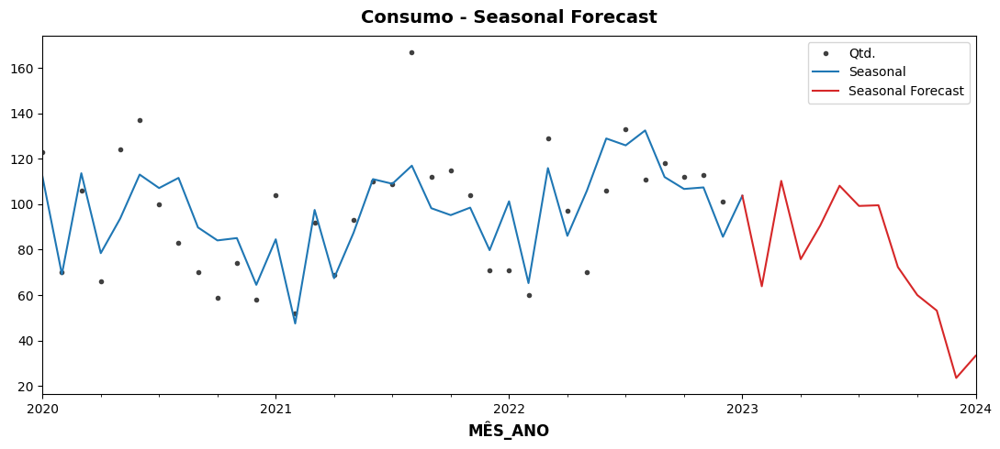

In [183]:
from statsmodels.tsa.deterministic import CalendarFourier, DeterministicProcess

# Criando 6 pares de curvais senoidais e cosenoidais com frequência mensal (PT) | Creating 6 pairs of sinusoidal and cosinoidal curves with monthly frequency (EN)
fourier = CalendarFourier(freq="ME", order=12)

# Feature de passagem de tempo com as curvas de fourier (PT) | Time-step feature with de fourier curves (EN)
dp = DeterministicProcess(
    index=consumo_group_train.index,
    constant=True,
    order=3,
    seasonal=True,
    additional_terms=[fourier],
    drop=True,
)
x_train = dp.in_sample()

# Valores alvo (PT) | Target feature (EN)
y_train = consumo_group_train["Qtd."]

# Treinamento do modelo (PT) | Training the model (EN)
model = LinearRegression(fit_intercept=False)
_ = model.fit(x_train, y_train)

# Previsão dos dados conhecidos (PT) | Forecasting known data (EN)
y_pred = pd.Series(model.predict(x_train), index=y_train.index)

# Previsão de novos dados (PT) | Forecasting unknown data (EN)
x_forecast = dp.out_of_sample(steps=13)
y_forecast = pd.Series(model.predict(x_forecast), index=x_forecast.index)

# Plotando resultados (PT) | Plotting the results (EN)
ax = y_train.plot(color='0.25', style='.', title="Consumo - Seasonal Forecast")
concat = pd.concat([y_pred, y_forecast])
ax = concat.loc[concat.index<='2023-01'].plot(ax=ax, label="Seasonal")
ax = concat.loc[concat.index>='2023-01'].plot(ax=ax, label="Seasonal Forecast", color='C3')
_ = ax.legend()

In [184]:
y_true = consumo_group_val["Qtd."]

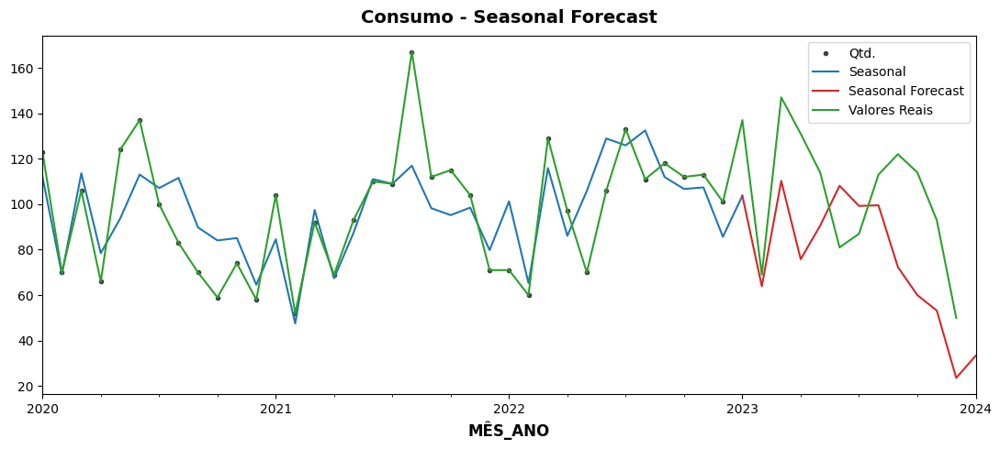

In [185]:
# Plotando resultados (PT) | Plotting the results (EN)
ax = y_train.plot(color='0.25', style='.', title="Consumo - Seasonal Forecast")
concat = pd.concat([y_pred, y_forecast])
concat2 = pd.concat([y_train, y_true])
ax = concat.loc[concat.index<='2023-01'].plot(ax=ax, label="Seasonal")
ax = concat.loc[concat.index>='2023-01'].plot(ax=ax, label="Seasonal Forecast", color='C3')
ax = concat2.plot(ax=ax, label="Valores Reais", color='C2')
_ = ax.legend()

Mean Absolute Error (MAE): 31.371494611190773
Mean Squared Error (MSE): 1234.0183435070765
R² Score: -0.5848403683869556


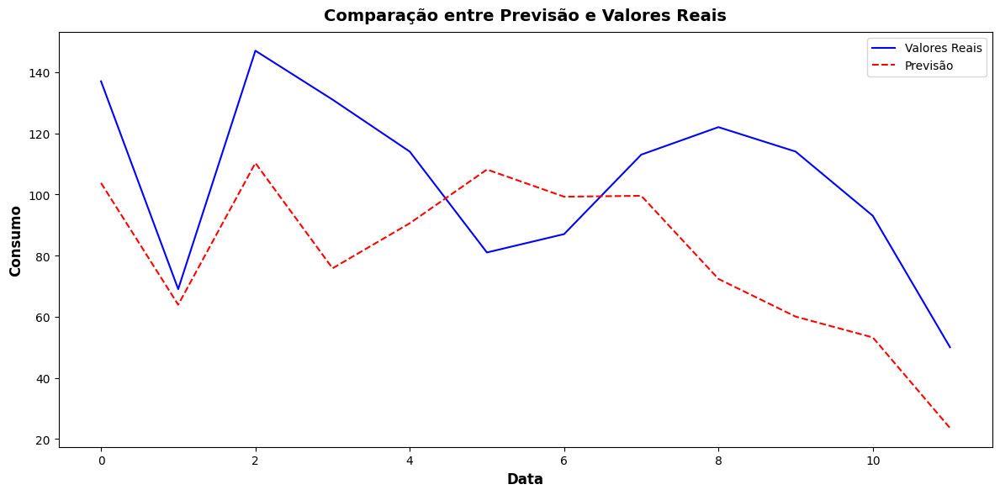

In [186]:
from sklearn.metrics import mean_absolute_error, mean_squared_error, r2_score

# Comparação das previsões com os dados de validação
# Assumindo que consumo_group_val possui o mesmo índice que y_forecast
y_true = consumo_group_val["Qtd."]  # Valores reais do conjunto de validação
y_pred = y_forecast.loc[y_true.index]  # Previsões correspondentes

# Cálculo das métricas de avaliação
mae = mean_absolute_error(y_true, y_pred)
mse = mean_squared_error(y_true, y_pred)
r2 = r2_score(y_true, y_pred)

print(f"Mean Absolute Error (MAE): {mae}")
print(f"Mean Squared Error (MSE): {mse}")
print(f"R² Score: {r2}")

# Plotando para visualizar a comparação
plt.figure(figsize=(12, 6))
plt.plot(y_true.values, label="Valores Reais", color="blue")
plt.plot(y_pred.values, label="Previsão", color="red", linestyle="--")
plt.title("Comparação entre Previsão e Valores Reais")
plt.xlabel("Data")
plt.ylabel("Consumo")
plt.legend()
plt.show()